##Take Home Assignment

# TakeHome
####**Brainstorming**:
####**Approach 1**: Fine-tune a large language model for job description classification, I  would train the model on a dataset where each job description is followed by its category label. This training teaches the model to predict the category as the next token after a job description. Once fine-tuned, the model can then classify new job descriptions by predicting the category based on the input text. This approach leverages the model's language understanding capabilities for a specific classification task. This approach is best suitable when the dataset does not change much and the categories are constant. It works well when the test and train datasets are from the same distribution

####**Approach 2**: Utilize a vector database to manage embeddings of job descriptions. It involves generating vector embeddings for each description, storing them in a vector database, and then, for a new job description, creating its embedding and querying the database to retrieve the top N semantically similar records. This method leverages the database's ability to efficiently perform similarity searches in a high-dimensional space, offering relevant matches based on the semantic content of the job descriptions. This approach works well when the categories are not constant and the dataset is dynamic.

####**Assumptions:**
#####The dataset is dynamic, as the job postings during various parts of the year may vary.
#####There is no fixed set of categories into which all the job postings may fall into.
#####There are currently no ways to estimate the relevant documents out of the retrieved ones.

####**Findings:** There are close to 700 categories in train there are 709 records in the test and there are only 602 categories that overlap. Assuming a fixed set of categories might be counterintuitive in our case. Using a fine-tuned model may give a better understanding of the context and might provide better results. Still, when it comes to handling out-of-distribution categories in the test data, it is going to overfit categories in the train.

####Another issue is that all categories are not equally represented and fine-tuning it to an imbalanced dataset will possibly lead to the under-representation of some classes, therefore skewing the results.

####Retrieval system might be a better approach as we have to handle dynamic data and it isn't easy to fine-tune every time we have new data. A retrieval system is a cost-efficient approach and easier to implement than fine-tuning. Specific to the use case, it is more reasonable to use a retrieval system to handle dynamic data and the out-of-distribution test set.

####**Implementation:** The input is the title of the job description appended to the body. The output is the ONET_NAME. All the input from the training data is encoded using sentence transformer embeddings and stored in an FAISS index. At inference time, use the test title and job description, retrieve top N documents that are semantically similar to the one provided, and return their labels as the predictions.

####**Evaluation:**
#####**Top K accuracy:**Accuracy is calculated if the ground truth category is found within the top K retrieved categories. K ranges from 1-5. However, this metric does not penalize based on rank.

#####**Mean Reciprocal Rank:** This metric ranks the prediction based on which position among the retrieved records is the ground truth present.

#####**Custom Evaluation Metric:** All the above metrics work well, given the assumption that the test is not out of distribution. In our case, the test being out of distribution penalizing the scores, and giving these data points zero might skew the final results. To handle this case, I propose a custom metric that will penalize the retrieved records only if they are not from the super category(the first two numbers of the ONET).

#####**Results:** The retrieval system has a mean reciprocal rank of 0.726 and has a mean of 0.733 on the custom metric proposed. The Top K accuracy of k=5 is 0.648 and k =1 is 0.4. The retrieval system is able to predict the right category 73% of the cases where the category is in the training  set and super category right when the category is not present in the training.

####**Final Conclusion:** The next steps would be to estimate how dynamic the dataset is over a period of time. Based on the findings, evaluate if retrieval system is better than fine tuning.  Given more time, I would investigate on the categories more and see if the test set is always going to be out of distribution and come up with a more robust metric that considers the out of distribution test set. In terms of scaling this model, it is not very difficult as scaling a fine tuned model. If new data point has to be added, adding the embedding of the new data point to the index is all that has to be done. It terms of scaling, retrieval system is the easiest way to go. Finding better evaluation metrics based on a larger dataset could help improve the performance better.









In [9]:
pip install faiss-cpu

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 17.6/17.6 MB 61.5 MB/s eta 0:00:00


In [6]:
!pip install sentence-transformers

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 2.8 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 12.7 MB/s eta 0:00:00
  Created wheel for sentence-transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125923 sha256=94efa93fec27ef9854898bdb7e63b5b6fd3aaf3ca5ede229b1b697d1a27b1c2b
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence-transformers


In [77]:
!pip install transformers

In [18]:
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import numpy as np
import faiss
from sklearn.model_selection import train_test_split
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
import seaborn as sns
from wordcloud import WordCloud
from sentence_transformers import SentenceTransformer

In [2]:
!unzip data.zip

Archive:  data.zip
  inflating: test_data.csv           
  inflating: __MACOSX/._test_data.csv  
  inflating: train_data.csv          
  inflating: __MACOSX/._train_data.csv  


In [3]:
train_df = pd.read_csv('train_data.csv')
test_df= pd.read_csv('test_data.csv')

###Exploratory Data Analysis

In [62]:
train_df[train_df['BODY'].isnull()]

,ID,POSTED,TITLE_RAW,BODY,ONET_NAME,ONET,content


In [13]:
unique_categories = train_df[~train_df['ONET'].isin(test_df['ONET'])]['ONET']


In [14]:
unique_categories

19       17-2161.00
22       33-3041.00
91       25-1126.00
120      17-2199.11
235      51-7021.00
            ...    
17148    51-9197.00
17409    47-4071.00
17651    13-2099.04
17792    25-1063.00
17843    25-1054.00
Name: ONET, Length: 184, dtype: object

In [50]:
value_counts=train_df['ONET'].value_counts()

In [41]:
frequency_one_count = (value_counts >300).sum()

In [16]:
test_df['ONET'].value_counts()

29-1141.00    765
99-9999.00    763
15-1252.00    526
41-4012.00    471
41-2031.00    434
             ... 
49-2021.00      1
13-1041.00      1
19-3093.00      1
35-2012.00      1
11-9161.00      1
Name: ONET, Length: 708, dtype: int64

In [51]:
value_counts.max()+1

960

In [56]:
value_counts = train_df['ONET'].value_counts()
df_value_counts = pd.DataFrame({'ONET Category': value_counts.index, 'Frequency': value_counts.values})
# Plotting a histogram
fig = px.histogram(df_value_counts, x='Frequency', nbins=50, title='Distribution of ONET Category Frequencies')
fig.update_layout(xaxis_title='Frequency', yaxis_title='Number of ONET Categories')
fig.show()

In [53]:
import plotly.express as px
import pandas as pd

value_counts = train_df['ONET_NAME'].value_counts()

top_50_categories = value_counts.head(50)

df_top_50 = pd.DataFrame({'ONET Category': top_50_categories.index, 'Frequency': top_50_categories.values})

fig = px.bar(df_top_50, x='ONET Category', y='Frequency', title='Top 50 ONET Categories by Frequency')
fig.update_layout(xaxis_title='ONET Category', yaxis_title='Frequency', xaxis={'categoryorder':'total descending'})
fig.update_xaxes(tickangle=45)
fig.show()


In [54]:
import plotly.express as px
import pandas as pd
value_counts = train_df['ONET_NAME'].value_counts()
top_50_categories = value_counts.tail(50)
df_top_50 = pd.DataFrame({'ONET Category': top_50_categories.index, 'Frequency': top_50_categories.values})
fig = px.bar(df_top_50, x='ONET Category', y='Frequency', title='Top 50 ONET Categories by Frequency')
fig.update_layout(xaxis_title='ONET Category', yaxis_title='Frequency', xaxis={'categoryorder':'total descending'})
fig.update_xaxes(tickangle=45)
fig.show()


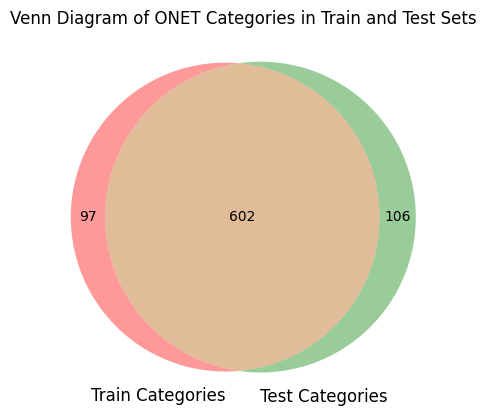

In [57]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2
import pandas as pd
train_categories = set(train_df['ONET'].unique())
test_categories = set(test_df['ONET'].unique())

venn2([train_categories, test_categories], ('Train Categories', 'Test Categories'))

plt.title("Venn Diagram of ONET Categories in Train and Test Sets")
plt.show()


In [59]:


# Text Preprocessing
train_df['TITLE_CLEANED'] = train_df['TITLE_RAW'].str.lower().str.replace('[^\w\s]', '', regex=True)


In [60]:
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(train_df['TITLE_CLEANED'])


In [71]:
n_clusters = 24
kmeans = KMeans(n_clusters=n_clusters)
train_df['cluster'] = kmeans.fit_predict(X)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



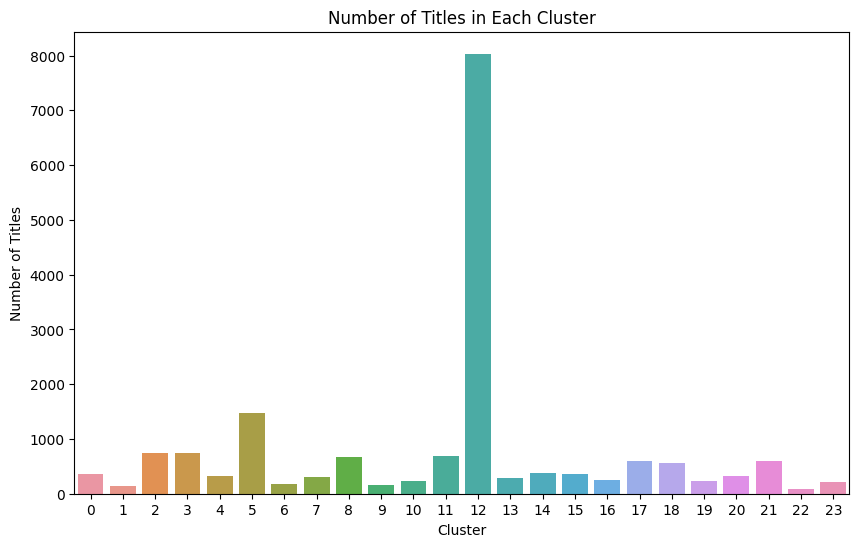

In [72]:
plt.figure(figsize=(10, 6))
sns.countplot(x='cluster', data=train_df)
plt.title('Number of Titles in Each Cluster')
plt.xlabel('Cluster')
plt.ylabel('Number of Titles')
plt.show()


Title similarity cannot be considered as a metric to evaluate the predicted labels because all titles from the same category does not appear together.

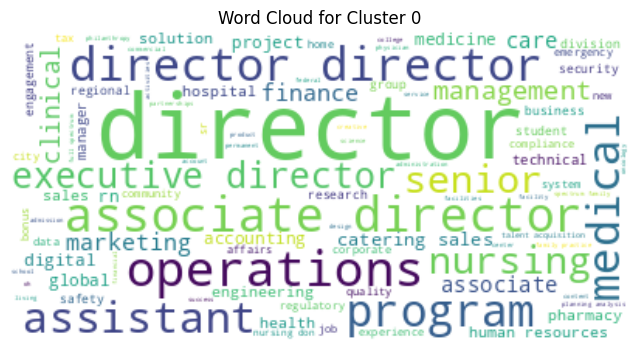

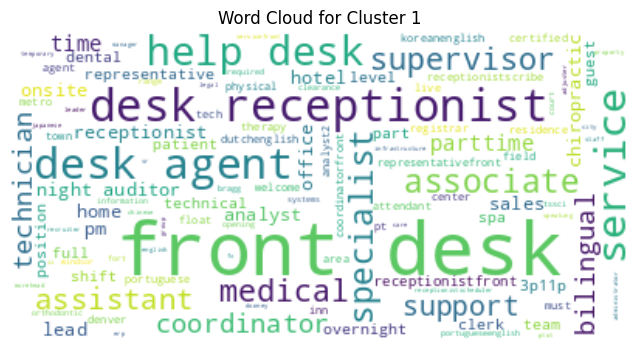

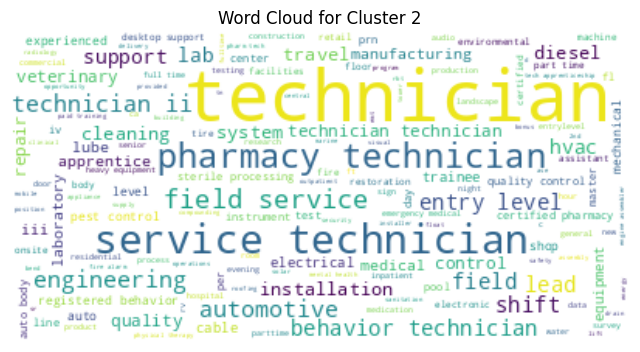

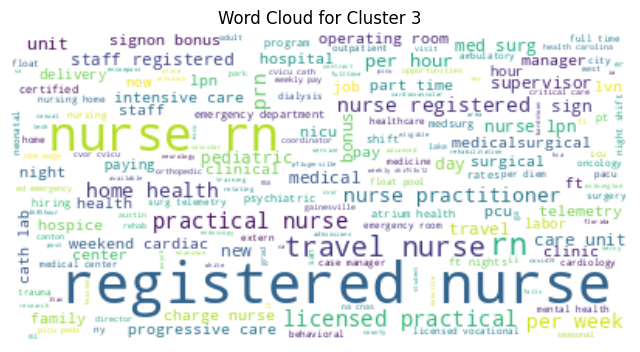

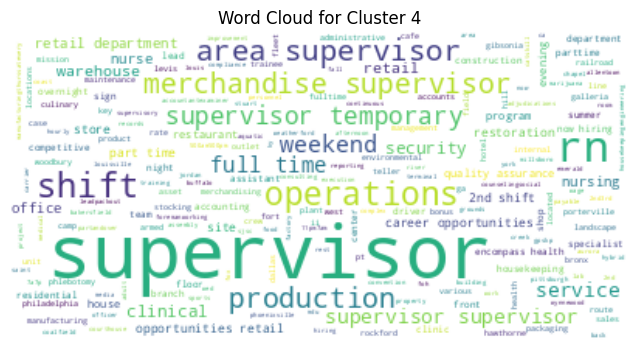

...

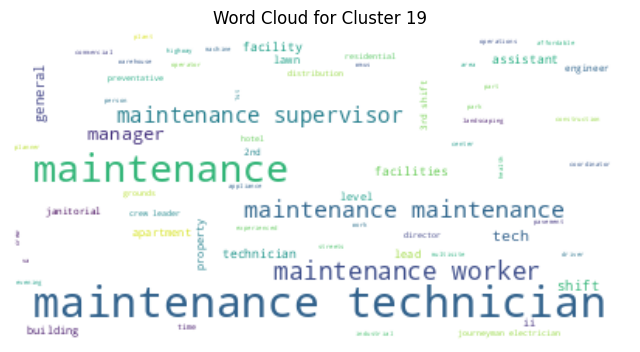

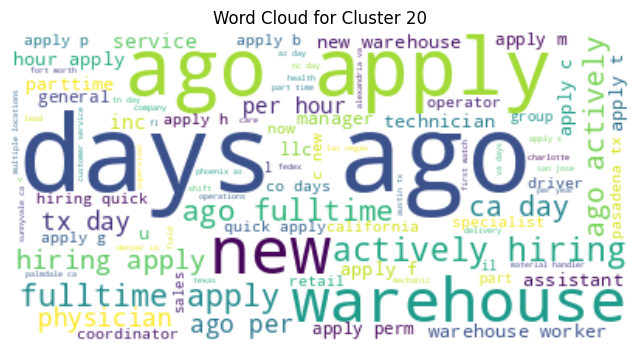

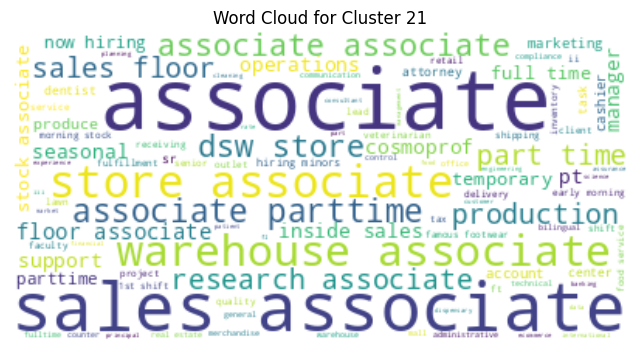

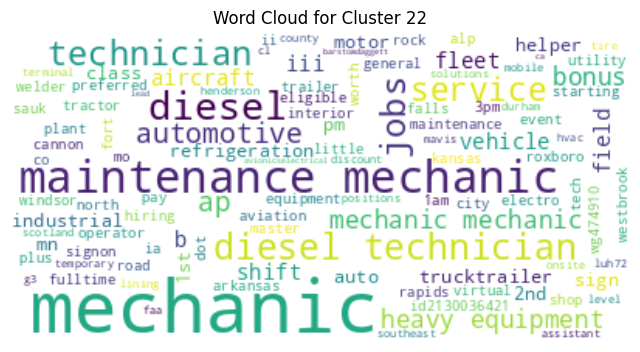

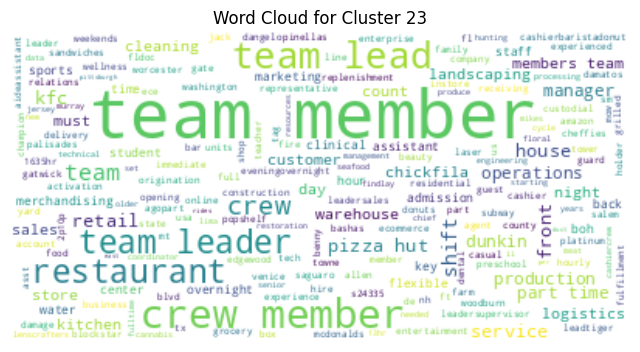

In [73]:


# Generate word clouds for each cluster
for i in range(n_clusters):
    plt.figure(figsize=(8, 6))
    subset = train_df[train_df['cluster'] == i]
    text = subset['TITLE_CLEANED'].str.cat(sep=' ')
    wordcloud = WordCloud(background_color='white').generate(text)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {i}')
    plt.axis('off')
    plt.show()


In [67]:
train_df['ONET2'] = train_df['ONET'].str[:2]


In [70]:
grouped_data = train_df.groupby('ONET2').size()
print(len(grouped_data))


24


###Word Cloud of most commonly occuring words in the job description

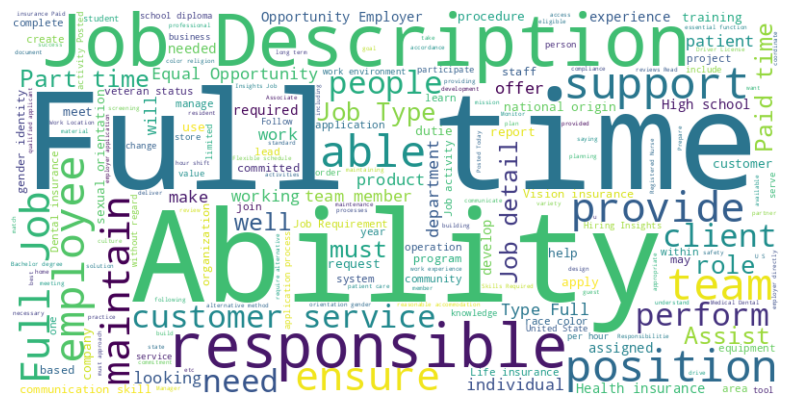

In [74]:
# Combine all job descriptions into a single string
all_descriptions = ' '.join(train_df['BODY'].dropna())

# Generate a word cloud image
wordcloud_all = WordCloud(background_color='white', width=800, height=400).generate(all_descriptions)

# Display the word cloud using matplotlib
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_all, interpolation='bilinear')
plt.axis('off')
plt.show()


###Clustering based on Super Category(First 2 characters of ONET)

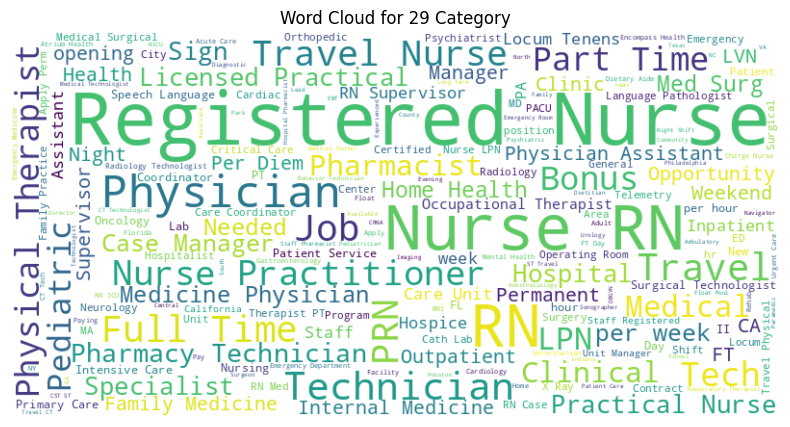

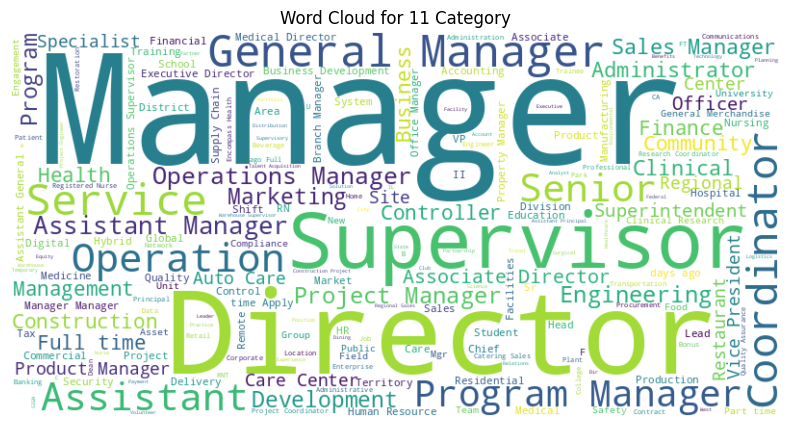

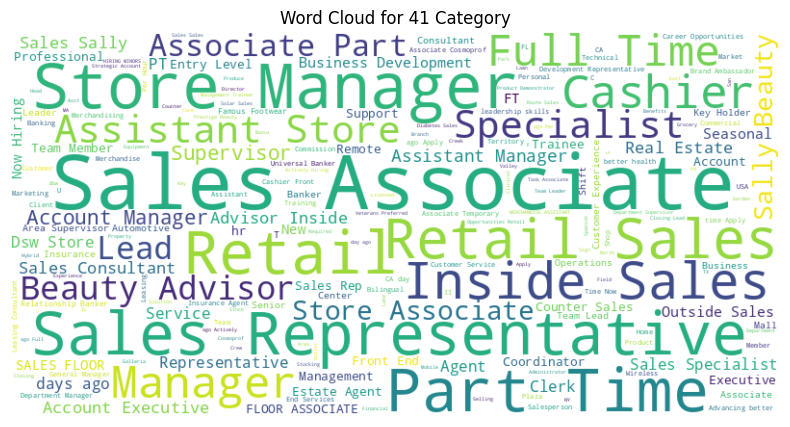

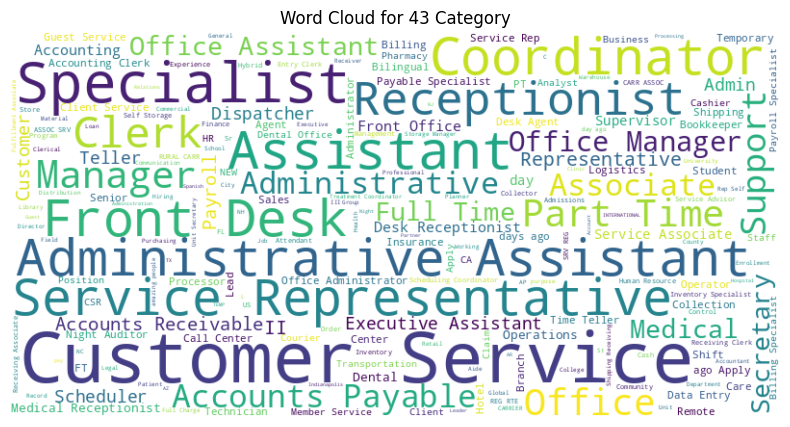

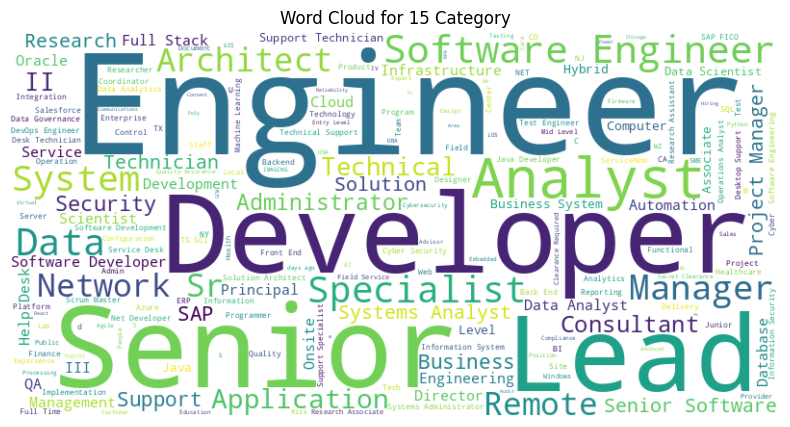

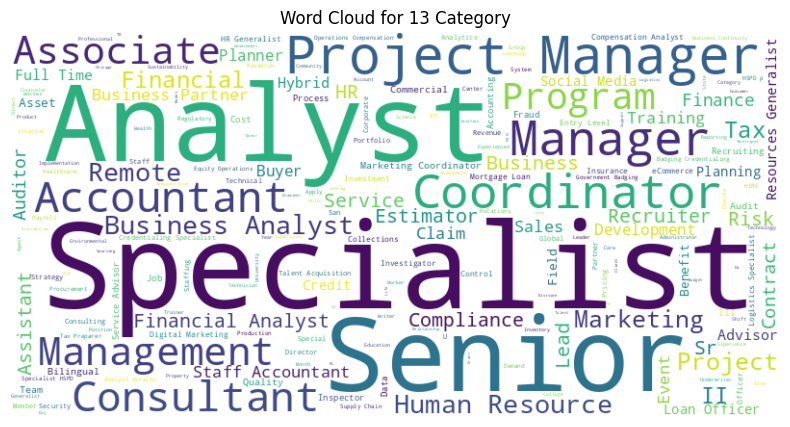

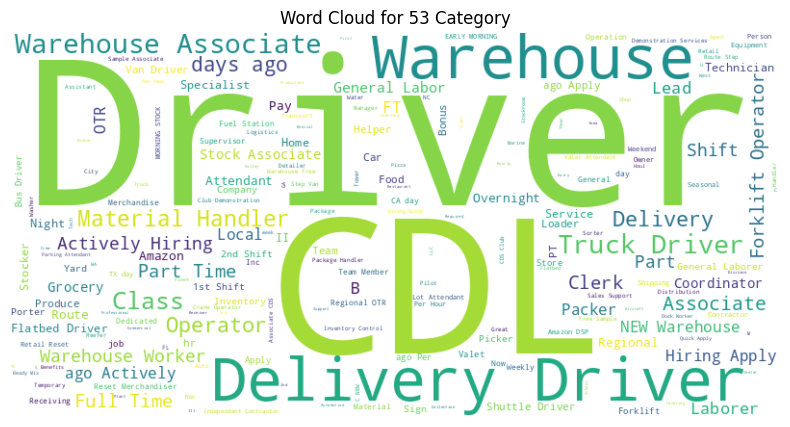

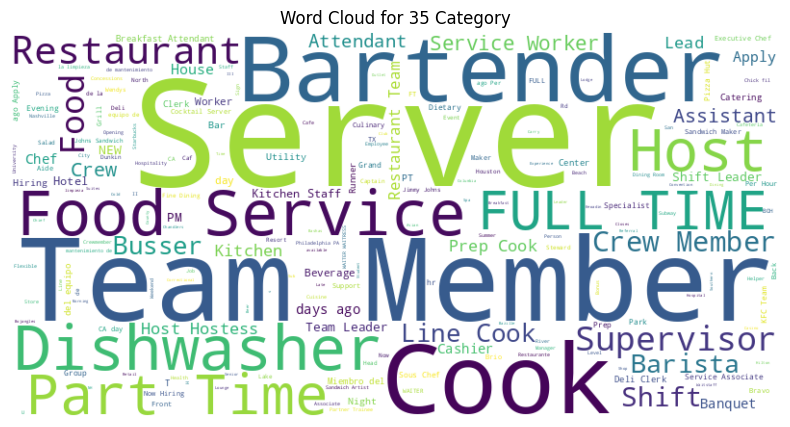

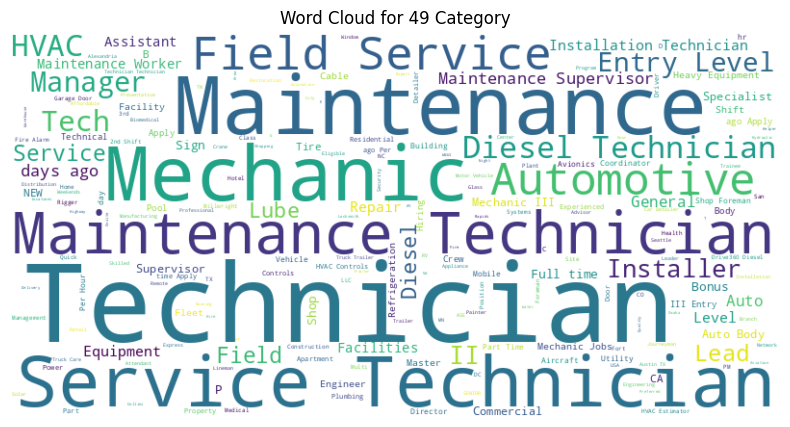

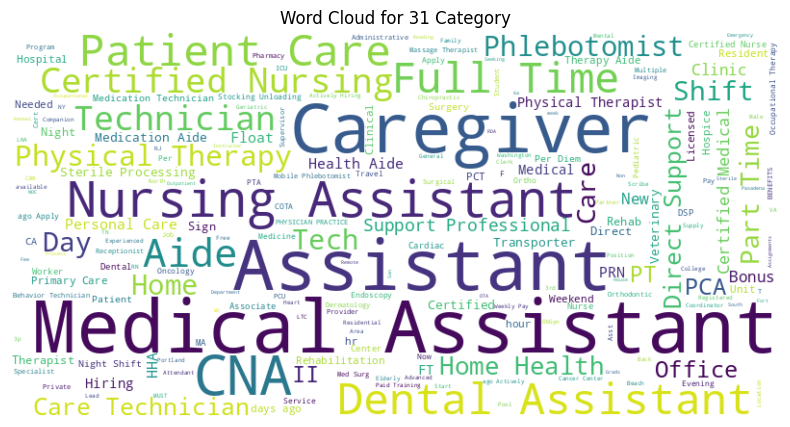

In [76]:

top_categories = train_df['ONET2'].value_counts().head(10).index

for category in top_categories:
    descriptions = ' '.join(train_df[train_df['ONET2'] == category]['TITLE_RAW'].dropna())
    wordcloud = WordCloud(background_color='white', width=800, height=400).generate(descriptions)

    plt.figure(figsize=(10, 5))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis('off')
    plt.title(f'Word Cloud for {category} Category')
    plt.show()


In [89]:
train_df['body_len'] = train_df['BODY'].apply(lambda x: len(x.split(" ")))  # Length in words


In [103]:
train_df[train_df['body_len']>1024]

,ID,POSTED,TITLE_RAW,BODY,ONET_NAME,ONET,TITLE_CLEANED,cluster,ONET2,body_len
1674,26797d98b5cf63855e064c8e70b740eeb3555162,2023-05-04,Home Visitor,Onsite - Work onsite all of the time\nJob Summ...,Social and Human Service Assistants,21-1093.00,home visitor,12,21,4073
3972,f95388bbc5d69b09f5bded09b51a65d20636336b,2023-05-04,Supervisory Accountant,Supervisory Accountant US Employment and Train...,Accountants and Auditors,13-2011.00,supervisory accountant,12,13,4104
4105,3e225469efdc3799f734286dbeb35b62a17417b0,2023-05-04,Registered Nurse - Mental Health Clinic,Registered Nurse - Mental Health Clinic US Vet...,Registered Nurses,29-1141.00,registered nurse mental health clinic,3,29,4215
7755,bcabe689ccc9d4c66445a5cfd35ef6e44633e7bf,2023-05-04,Diagnostic Radiologic Tech - Interventional Ra...,Diagnostic Radiologic Tech - Interventional Ra...,Radiologic Technologists and Technicians,29-2034.00,diagnostic radiologic tech interventional rad...,12,29,4259
9067,a1a6fde1d501aaea7debb0bc88f424d8e63266c1,2023-05-16,Nurse Manager,"usagov Posted Under: Decatur, Georgia jobs in ...",Registered Nurses,29-1141.00,nurse manager,5,29,4339
9706,7b3ca36ea7df26b2d2f1eb403f914f16107004dc,2023-05-16,Foreign Service Contracting Officer,Foreign Service Contracting Officer\nU.S. Agen...,Chief Executives,11-1011.00,foreign service contracting officer,18,11,4065
9724,82911b70be352ec90d18d72585930ba9386d0151,2023-05-16,Summer 2023 Sales & Marketing Internship,Onsite - Work onsite all of the time\nJob Summ...,Unclassified,99-9999.00,summer 2023 sales marketing internship,12,99,4292
11507,a625e6d6593a4d4e8e127758187bc2f98f762582,2023-05-16,"Texas, State Compensatory Education Manager (T...",Onsite - Work onsite all of the time\nJob Summ...,Accountants and Auditors,13-2011.00,texas state compensatory education manager top...,12,13,4024
13561,7e300c18e234c77d66cc7c887445a7dcf6bddf4a,2023-05-16,"New Mexico, High School CTE/Elective Teacher (...",Onsite - Work onsite all of the time\nJob Summ...,"Secondary School Teachers, Except Special and ...",25-2031.00,new mexico high school cteelective teacher nmdca,13,25,4032
16792,7062b6a1a6803ecb371fac3ee53c49bccc1b8fe7,2023-01-19,"Solution Architect/Sr. Solution Architect, Com...",Job Summary\nFirst Job\n \nPrevious Job\n391 o...,Computer Systems Engineers/Architects,15-1299.08,solution architectsr solution architect commer...,12,15,4126


###Distribution of Word Length in Job Description

Text(0.5, 0, 'Length')

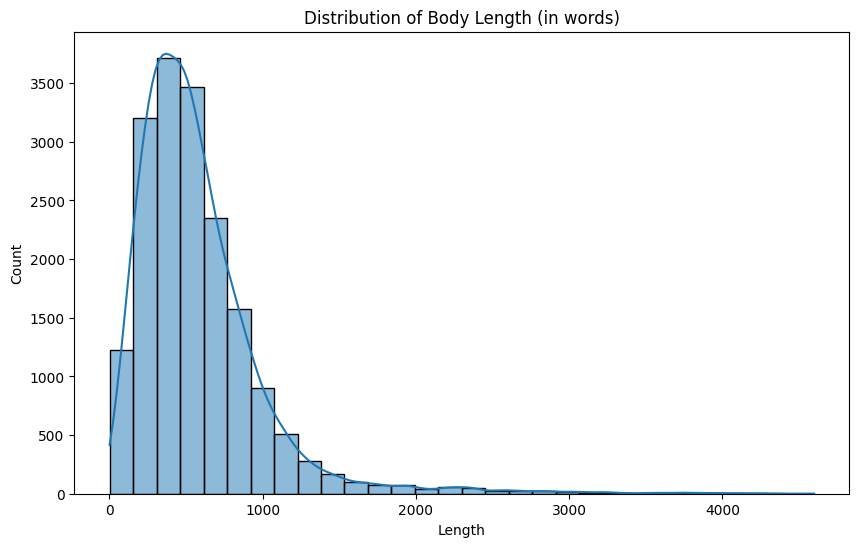

In [96]:
plt.figure(figsize=(10, 6))
sns.histplot(train_df['body_len'], kde=True, bins=30)  # Adjust bins as needed
plt.title('Distribution of Body Length (in words)')
plt.xlabel('Length')


In [4]:
train_df['content']=train_df['TITLE_RAW']+" " +train_df['BODY']
test_df['content']=test_df['TITLE_RAW']+" " +test_df['BODY']

In [58]:

model = SentenceTransformer('all-MiniLM-L6-v2')

questions = train_df['content'].tolist()
question_embeddings = model.encode(questions)


In [67]:
labels = train_df['ONET_NAME'].tolist()
labels_id=train_df['ONET'].tolist()
assert len(questions) == len(labels)

label_mapping = labels



In [13]:
dimension = question_embeddings.shape[1]
index = faiss.IndexFlatL2(dimension)
index.add(question_embeddings)


In [16]:
def predict(query):
  query_embedding = model.encode([query])
  D, I = index.search(np.array(query_embedding), k=5)  # Adjust `k` as needed

  # Retrieve labels for the top `k` results
  retrieved_labels = [label_mapping[i] for i in I[0]]
  return retrieved_labels


In [71]:
def predict_id(query):
  query_embedding = model.encode([query])
  D, I = index.search(np.array(query_embedding), k=5)  # Adjust `k` as needed

  # Retrieve labels for the top `k` results
  # retrieved_labels = [label_mapping[i] for i in I[0]]
  retrieved_labels = [labels_id[i][:2] for i in I[0]]
  return retrieved_labels

In [72]:
test_df['pred_id']=test_df['content'].apply(predict_id)

In [23]:
test_df['predicted'] = test_df['content'].apply(predict)



In [73]:
test_df

,ID,POSTED,TITLE_RAW,BODY,ONET_NAME,ONET,content,predicted,rank,pred_id
0,f42f82cfc80cd078f70b900cc9d97e37c609fc18,2022-01-06,Grocery Order Writer (Buyer / Inventory Replen...,Grocery Order Writer (Buyer / Inventory Replen...,"Purchasing Agents, Except Wholesale, Retail, a...",13-1023.00,Grocery Order Writer (Buyer / Inventory Replen...,"[Shipping, Receiving, and Inventory Clerks, Pu...",2,"[43, 13, 41, 41, 51]"
1,892baace0e78f3c054eb184a6d45639a6191d1c4,2022-01-06,Superintendent,Apply to this job. \nThink you're the perfect ...,"Education Administrators, Kindergarten through...",11-9032.00,Superintendent Apply to this job. \nThink you'...,"[Construction Managers, Construction Managers,...",5,"[11, 11, 47, 11, 11]"
2,aac5926cba525496d8e57bb0f2e5550b9df15267,2022-01-06,Software Developer IV,Software Developer IV\nJob Locations\nUS-NE-Om...,Software Developers,15-1252.00,Software Developer IV Software Developer IV\nJ...,"[Web Developers, Software Developers, Commerci...",2,"[15, 15, 27, 15, 15]"
3,a8c7c1e5250794125a25905073a688e9e8eb62e8,2022-01-06,Auto Glass Technician,Auto Glass Technician Gerber Collision & Glass...,Automotive Service Technicians and Mechanics,49-3023.00,Auto Glass Technician Auto Glass Technician Ge...,"[Installation, Maintenance, and Repair Workers...",3,"[49, 49, 49, 43, 49]"
4,ef5b7131dc91f2bc63458622ea01bc23e365eda8,2022-01-06,Food and Beverage Operations Manager,Food and Beverage Operations Manager Wavetroni...,Food Service Managers,11-9051.00,Food and Beverage Operations Manager Food and ...,"[General and Operations Managers, First-Line S...",3,"[11, 43, 11, 35, 15]"
...,...,...,...,...,...,...,...,...,...,...
19389,572a7f48ce3c8fcd6a55b1bd0c0f211dc537d422,2022-01-07,Project/ Program Manager III,Apply to this job. \nThink you're the perfect ...,Project Management Specialists,13-1082.00,Project/ Program Manager III Apply to this job...,"[Financial and Investment Analysts, Computer S...",None,"[13, 15, 15, 11, 15]"
19390,226290306b705ae0256c5e5f351b84b58a7cc218,2022-01-07,JPC - 117241 - Structural Design,Job Description\n\nPrint\nStructural Design\nF...,Civil Engineers,17-2051.00,JPC - 117241 - Structural Design Job Descripti...,"[Civil Engineers, Electrical Engineers, Electr...",1,"[17, 17, 51, 27, 17]"
19391,145ea737365e0289e2f7ec7d703d98f2b0551f94,2022-01-07,Speech Pathologist,Apply to this job. \nThink you're the perfect ...,Speech-Language Pathologists,29-1127.00,Speech Pathologist Apply to this job. \nThink ...,"[Speech-Language Pathologists, Speech-Language...",1,"[29, 29, 29, 29, 29]"
19392,0d1314c5f5e11678a6cdb4668687b84816757a5b,2022-01-07,Project Manager,ZipApply\nProject Manager\nCat in a Hammock In...,Project Management Specialists,13-1082.00,Project Manager ZipApply\nProject Manager\nCat...,"[Construction Managers, Project Management Spe...",2,"[11, 13, 47, 11, 13]"


In [59]:

train_values = set(train_df['ONET_NAME'])
test_values = set(test_df['ONET_NAME'])

# Find values in test set that are not in train set
unique_to_test = test_values - train_values

print(unique_to_test)

{'Petroleum Pump System Operators, Refinery Operators, and Gaugers', 'Sawing Machine Setters, Operators, and Tenders, Wood', 'Mining and Geological Engineers, Including Mining Safety Engineers', 'Medical Transcriptionists', 'Weatherization Installers and Technicians', 'Materials Scientists', 'Budget Analysts', 'Extraction Workers, All Other', 'Camera and Photographic Equipment Repairers', 'Pediatric Surgeons', 'Crushing, Grinding, and Polishing Machine Setters, Operators, and Tenders', 'Desktop Publishers', 'Cooling and Freezing Equipment Operators and Tenders', 'Healthcare Support Workers, All Other', 'Forging Machine Setters, Operators, and Tenders, Metal and Plastic', 'Welding, Soldering, and Brazing Machine Setters, Operators, and Tenders', 'Tank Car, Truck, and Ship Loaders', 'Orthodontists', 'Landscape Architects', 'Engine and Other Machine Assemblers', 'Air Traffic Controllers', 'Underground Mining Machine Operators, All Other', 'Brokerage Clerks', 'Clinical Nurse Specialists', 

In [ ]:
import faiss
faiss.write_index(index, 'data.index')


In [11]:
index = faiss.read_index('data.index')

In [64]:
def find_index_in_list(value, lst):
    try:
        return lst.index(value)+1
    except ValueError:
        return 'None'

# Apply the function to each row
test_df['rank'] = test_df.apply(lambda row: find_index_in_list(row['ONET_NAME'], row['predicted']), axis=1)



In [65]:
test_df['rank'].unique()

array([2, 5, 3, 1, 'None', 4], dtype=object)

###Evaluation

Mean Reciprocal Rank

#### There is no way to determine relevancy, so metrics like NDCG, Recall@K cannot be used.

In [66]:
def calculate_mrr(ranks):
    reciprocal_ranks = []

    for rank in ranks:
        if rank!='None' and rank > 0:
            reciprocal_ranks.append(1.0 / rank)
    if reciprocal_ranks:
        return sum(reciprocal_ranks) / len(reciprocal_ranks)
    else:
        return 0  # Handle the case where there are no ranks


mrr = calculate_mrr(test_df['rank'].tolist())
print("Mean Reciprocal Rank (MRR):", mrr)


Mean Reciprocal Rank (MRR): 0.7621242245904233


Top K Accuracy

In [55]:
def top_k_accuracy(k):
    correct_count = 0
    for i in range(len(test_df)):
        if test_df.iloc[i]['ONET_NAME'] in test_df.iloc[i]['predicted'][:k]:
            correct_count += 1
    return correct_count / len(test_df)

k = 5
accuracy = top_k_accuracy( k)
print(f"Top-{k} Accuracy: {accuracy}")


Top-5 Accuracy: 0.6483448489223471


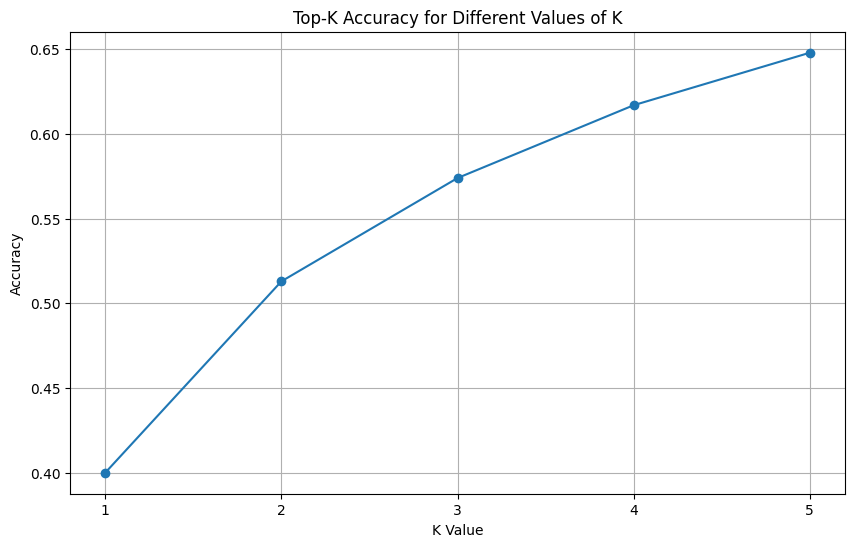

In [56]:

k_values = [1, 2,3,4,5]
accuracies = [0.40, 0.513, 0.574, 0.617, 0.648]

plt.figure(figsize=(10, 6))
plt.plot(k_values, accuracies, marker='o')
plt.title('Top-K Accuracy for Different Values of K')
plt.xlabel('K Value')
plt.ylabel('Accuracy')
plt.xticks(k_values)
plt.grid(True)
plt.show()


However, these metrics considers the categories that are in the train set only. Anything that is not in the train set is considered not a real category. But it is not a fair way to evaluate the out of distribution categories.

The custom metrics that I propose is for the categories that are not in the train set but in the test set. This custom metric will penalize the model if it is not on the same super category only. This way it need not be the exact category but can fall in the same super category to be considered correct.

Custom Metric

In [75]:
def calculate_custom_metric(row):
    if row['ONET_NAME'] in row['predicted']:
        return 1
    else:
        code = row['ONET'][:2]
        return row['pred_id'].count(code) / len(row['pred_id']) if row['pred_id'] else 0

# Apply the function to each row
test_df['custom_metric'] = test_df.apply(calculate_custom_metric, axis=1)


In [76]:
test_df['custom_metric'].mean()

0.7336908322161494